In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
churn_data = pd.read_csv('churn_data.csv')
customer_data = pd.read_csv('customer_data.csv')
internet_data = pd.read_csv('internet_data.csv')

In [4]:
# Merging churn_Data with customer_data on cusotmer_id
df_1 = pd.merge(churn_data, customer_data, on='customerID')

In [5]:
df_1.head()

,customerID,tenure,PhoneService,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,gender,SeniorCitizen,Partner,Dependents
0,7590-VHVEG,1,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,Female,0,Yes,No
1,5575-GNVDE,34,Yes,One year,No,Mailed check,56.95,1889.5,No,Male,0,No,No
2,3668-QPYBK,2,Yes,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,Male,0,No,No
3,7795-CFOCW,45,No,One year,No,Bank transfer (automatic),42.30,1840.75,No,Male,0,No,No
4,9237-HQITU,2,Yes,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,Female,0,No,No


In [6]:
# Final dataframe with all predictors variables (merging df_1 and internet_data on 'customerID')
telecom = pd.merge(df_1, internet_data, on='customerID')

In [7]:
telecom.head()

,customerID,tenure,PhoneService,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,gender,SeniorCitizen,Partner,Dependents,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,1,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,Female,0,Yes,No,No phone service,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,34,Yes,One year,No,Mailed check,56.95,1889.5,No,Male,0,No,No,No,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,2,Yes,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,Male,0,No,No,No,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,45,No,One year,No,Bank transfer (automatic),42.30,1840.75,No,Male,0,No,No,No phone service,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,2,Yes,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,Female,0,No,No,No,Fiber optic,No,No,No,No,No,No


In [8]:
telecom.shape

(7043, 21)

In [9]:
telecom.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   tenure            7043 non-null   int64  
 2   PhoneService      7043 non-null   object 
 3   Contract          7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
 8   Churn             7043 non-null   object 
 9   gender            7043 non-null   object 
 10  SeniorCitizen     7043 non-null   int64  
 11  Partner           7043 non-null   object 
 12  Dependents        7043 non-null   object 
 13  MultipleLines     7043 non-null   object 
 14  InternetService   7043 non-null   object 
 15  OnlineSecurity    7043 non-null   object 
 16  OnlineBackup      7043 non-null   object 


In [10]:
telecom.describe()

,tenure,MonthlyCharges,SeniorCitizen
count,7043.000000,7043.000000,7043.000000
mean,32.371149,64.761692,0.162147
std,24.559481,30.090047,0.368612
min,0.000000,18.250000,0.000000
25%,9.000000,35.500000,0.000000
50%,29.000000,70.350000,0.000000
75%,55.000000,89.850000,0.000000
max,72.000000,118.750000,1.000000


## Data Preperation

In [11]:
# Converting Yes to 1 and No to 0 using map

telecom['PhoneService'] = telecom['PhoneService'].map({'Yes': 1, 'No': 0})
telecom['PaperlessBilling'] = telecom['PaperlessBilling'].map({'Yes': 1, 'No': 0})
telecom['Churn'] = telecom['Churn'].map({'Yes': 1, 'No': 0})
telecom['Partner'] = telecom['Partner'].map({'Yes': 1, 'No': 0})
telecom['Dependents'] = telecom['Dependents'].map({'Yes': 1, 'No': 0})

In [12]:
telecom.head()

,customerID,tenure,PhoneService,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,gender,SeniorCitizen,Partner,Dependents,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,1,0,Month-to-month,1,Electronic check,29.85,29.85,0,Female,0,1,0,No phone service,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,34,1,One year,0,Mailed check,56.95,1889.5,0,Male,0,0,0,No,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,2,1,Month-to-month,1,Mailed check,53.85,108.15,1,Male,0,0,0,No,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,45,0,One year,0,Bank transfer (automatic),42.30,1840.75,0,Male,0,0,0,No phone service,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,2,1,Month-to-month,1,Electronic check,70.70,151.65,1,Female,0,0,0,No,Fiber optic,No,No,No,No,No,No


In [13]:
# Dummy Variable Creation
cont = pd.get_dummies(telecom['Contract'], prefix='Contract', drop_first=True)
telecom = pd.concat([telecom, cont], axis=1)

pm = pd.get_dummies(telecom['PaymentMethod'], prefix='PaymentMethod', drop_first=True)
telecom = pd.concat([telecom, pm], axis=1)

gen = pd.get_dummies(telecom['gender'], prefix='gender', drop_first=True)
telecom = pd.concat([telecom, gen], axis=1)

ml = pd.get_dummies(telecom['MultipleLines'], prefix='MultipleLines')
ml1 = ml.drop(['MultipleLines_No phone service'], axis=1)
telecom = pd.concat([telecom,ml1], axis=1)

iser = pd.get_dummies(telecom['InternetService'], prefix='InternetService', drop_first=True)
telecom = pd.concat([telecom, iser], axis=1)

os = pd.get_dummies(telecom['OnlineSecurity'], prefix='OnlineSecurity')
os1 = os.drop(['OnlineSecurity_No internet service'], axis=1)
telecom = pd.concat([telecom,os1], axis=1)

ob = pd.get_dummies(telecom['OnlineBackup'], prefix='OnlineBackup')
ob1 = ob.drop(['OnlineBackup_No internet service'], axis=1)
telecom = pd.concat([telecom,ob1], axis=1)

dp = pd.get_dummies(telecom['DeviceProtection'], prefix='DeviceProtection')
dp1 = dp.drop(['DeviceProtection_No internet service'], axis=1)
telecom = pd.concat([telecom,dp1], axis=1)

ts = pd.get_dummies(telecom['TechSupport'], prefix='TechSupport')
ts1 = ts.drop(['TechSupport_No internet service'], axis=1)
telecom = pd.concat([telecom,ts1], axis=1)

stv = pd.get_dummies(telecom['StreamingTV'], prefix='StreamingTV')
stv1 = stv.drop(['StreamingTV_No internet service'], axis=1)
telecom = pd.concat([telecom,stv1], axis=1)

sm = pd.get_dummies(telecom['StreamingMovies'], prefix='StreamingMovies')
sm1 = sm.drop(['StreamingMovies_No internet service'], axis=1)
telecom = pd.concat([telecom,sm1], axis=1)

In [14]:
telecom.head()

,customerID,tenure,PhoneService,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,gender,SeniorCitizen,Partner,Dependents,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,gender_Male,MultipleLines_No,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_Yes,TechSupport_No,TechSupport_Yes,StreamingTV_No,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_Yes
0,7590-VHVEG,1,0,Month-to-month,1,Electronic check,29.85,29.85,0,Female,0,1,0,No phone service,DSL,No,Yes,No,No,No,No,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,1,0,1,0,1,0
1,5575-GNVDE,34,1,One year,0,Mailed check,56.95,1889.5,0,Male,0,0,0,No,DSL,Yes,No,Yes,No,No,No,1,0,0,0,1,1,1,0,0,0,0,1,1,0,0,1,1,0,1,0,1,0
2,3668-QPYBK,2,1,Month-to-month,1,Mailed check,53.85,108.15,1,Male,0,0,0,No,DSL,Yes,Yes,No,No,No,No,0,0,0,0,1,1,1,0,0,0,0,1,0,1,1,0,1,0,1,0,1,0
3,7795-CFOCW,45,0,One year,0,Bank transfer (automatic),42.30,1840.75,0,Male,0,0,0,No phone service,DSL,Yes,No,Yes,Yes,No,No,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0,1,1,0,1,0
4,9237-HQITU,2,1,Month-to-month,1,Electronic check,70.70,151.65,1,Female,0,0,0,No,Fiber optic,No,No,No,No,No,No,0,0,0,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0


In [15]:
telecom = telecom.drop(['Contract', 'PaymentMethod', 'gender', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies'], axis=1)
telecom.head()

,customerID,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,Churn,SeniorCitizen,Partner,Dependents,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,gender_Male,MultipleLines_No,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_Yes,TechSupport_No,TechSupport_Yes,StreamingTV_No,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_Yes
0,7590-VHVEG,1,0,1,29.85,29.85,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,1,0,1,0,1,0
1,5575-GNVDE,34,1,0,56.95,1889.5,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,1,1,0,0,1,1,0,1,0,1,0
2,3668-QPYBK,2,1,1,53.85,108.15,1,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,1,1,0,1,0,1,0,1,0
3,7795-CFOCW,45,0,0,42.30,1840.75,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0,1,1,0,1,0
4,9237-HQITU,2,1,1,70.70,151.65,1,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0


In [16]:
telecom['TotalCharges'] = pd.to_numeric(telecom['TotalCharges'], errors='coerce')

In [17]:
telecom.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 32 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   customerID                             7043 non-null   object 
 1   tenure                                 7043 non-null   int64  
 2   PhoneService                           7043 non-null   int64  
 3   PaperlessBilling                       7043 non-null   int64  
 4   MonthlyCharges                         7043 non-null   float64
 5   TotalCharges                           7032 non-null   float64
 6   Churn                                  7043 non-null   int64  
 7   SeniorCitizen                          7043 non-null   int64  
 8   Partner                                7043 non-null   int64  
 9   Dependents                             7043 non-null   int64  
 10  Contract_One year                      7043 non-null   uint8  
 11  Cont

In [18]:
# Checking for Outliers

num_telecom = telecom[['tenure', 'MonthlyCharges', 'SeniorCitizen', 'TotalCharges']]

In [19]:
num_telecom.describe(percentiles=[.25, .5, .75, .90, .95, .99])

,tenure,MonthlyCharges,SeniorCitizen,TotalCharges
count,7043.000000,7043.000000,7043.000000,7032.000000
mean,32.371149,64.761692,0.162147,2283.300441
std,24.559481,30.090047,0.368612,2266.771362
min,0.000000,18.250000,0.000000,18.800000
25%,9.000000,35.500000,0.000000,401.450000
50%,29.000000,70.350000,0.000000,1397.475000
75%,55.000000,89.850000,0.000000,3794.737500
90%,69.000000,102.600000,1.000000,5976.640000
95%,72.000000,107.400000,1.000000,6923.590000
99%,72.000000,114.729000,1.000000,8039.883000


In [20]:
# Check for missing values
round(telecom.isnull().sum()/telecom.shape[0]*100,2)

customerID                               0.00
tenure                                   0.00
PhoneService                             0.00
PaperlessBilling                         0.00
MonthlyCharges                           0.00
TotalCharges                             0.16
Churn                                    0.00
SeniorCitizen                            0.00
Partner                                  0.00
Dependents                               0.00
Contract_One year                        0.00
Contract_Two year                        0.00
PaymentMethod_Credit card (automatic)    0.00
PaymentMethod_Electronic check           0.00
PaymentMethod_Mailed check               0.00
gender_Male                              0.00
MultipleLines_No                         0.00
MultipleLines_Yes                        0.00
InternetService_Fiber optic              0.00
InternetService_No                       0.00
OnlineSecurity_No                        0.00
OnlineSecurity_Yes                

In [21]:
telecom = telecom[~np.isnan(telecom['TotalCharges'])]
telecom.isnull().sum()

customerID                               0
tenure                                   0
PhoneService                             0
PaperlessBilling                         0
MonthlyCharges                           0
TotalCharges                             0
Churn                                    0
SeniorCitizen                            0
Partner                                  0
Dependents                               0
Contract_One year                        0
Contract_Two year                        0
PaymentMethod_Credit card (automatic)    0
PaymentMethod_Electronic check           0
PaymentMethod_Mailed check               0
gender_Male                              0
MultipleLines_No                         0
MultipleLines_Yes                        0
InternetService_Fiber optic              0
InternetService_No                       0
OnlineSecurity_No                        0
OnlineSecurity_Yes                       0
OnlineBackup_No                          0
OnlineBacku

In [22]:
# Feature Standardisation

df = telecom[['tenure', 'MonthlyCharges', 'TotalCharges']]

std_df = (df-df.mean())/df.std()
std_df.head()

,tenure,MonthlyCharges,TotalCharges
0,-1.280157,-1.161611,-0.994123
1,0.064298,-0.260859,-0.173727
2,-1.239416,-0.363897,-0.959581
3,0.512450,-0.747797,-0.195234
4,-1.239416,0.196164,-0.940391


In [23]:
telecom = telecom.drop(['tenure', 'MonthlyCharges', 'TotalCharges'], axis=1)
telecom.head()

,customerID,PhoneService,PaperlessBilling,Churn,SeniorCitizen,Partner,Dependents,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,gender_Male,MultipleLines_No,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_Yes,TechSupport_No,TechSupport_Yes,StreamingTV_No,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_Yes
0,7590-VHVEG,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,1,0,1,0,1,0
1,5575-GNVDE,1,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,1,1,0,0,1,1,0,1,0,1,0
2,3668-QPYBK,1,1,1,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,1,1,0,1,0,1,0,1,0
3,7795-CFOCW,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0,1,1,0,1,0
4,9237-HQITU,1,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0


In [24]:
telecom = pd.concat([telecom, std_df], axis=1)
telecom.head()

,customerID,PhoneService,PaperlessBilling,Churn,SeniorCitizen,Partner,Dependents,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,gender_Male,MultipleLines_No,MultipleLines_Yes,InternetService_Fiber optic,InternetService_No,OnlineSecurity_No,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_Yes,DeviceProtection_No,DeviceProtection_Yes,TechSupport_No,TechSupport_Yes,StreamingTV_No,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_Yes,tenure,MonthlyCharges,TotalCharges
0,7590-VHVEG,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,1,0,1,0,1,0,-1.280157,-1.161611,-0.994123
1,5575-GNVDE,1,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,0,1,1,0,0,1,1,0,1,0,1,0,0.064298,-0.260859,-0.173727
2,3668-QPYBK,1,1,1,0,0,0,0,0,0,0,1,1,1,0,0,0,0,1,0,1,1,0,1,0,1,0,1,0,-1.239416,-0.363897,-0.959581
3,7795-CFOCW,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0,1,1,0,1,0,0.512450,-0.747797,-0.195234
4,9237-HQITU,1,1,1,0,0,0,0,0,0,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,-1.239416,0.196164,-0.940391


In [25]:
# Checking for Churn Rate

churn = round(sum(telecom['Churn'])/telecom.shape[0]*100,2)
churn

26.58

We have around 27% of Churn rate

In [26]:
# Model Building

X = telecom.drop(['customerID', 'Churn'], axis=1)
y = telecom['Churn']

y.head()

0    0
1    0
2    1
3    0
4    1
Name: Churn, dtype: int64

Statsmodel provides a Logit() function for performing logistic regression. The Logit() funtion accepts y and X as parameters and returns
Logit Object. The model is then fitted to the data.

In [27]:
import statsmodels.api as sm

In [28]:
X = sm.add_constant(X)

In [29]:
# Splitting of data set 

X_train,X_test, y_train,y_test = train_test_split(X,y, test_size=0.2, random_state=51)

In [30]:
# Logistic Regression

logm1 = sm.Logit(y_train, X_train)
logm1.fit().summary()

Optimization terminated successfully.
         Current function value: 0.416689
         Iterations 17


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  Churn   No. Observations:                 5625
Model:                          Logit   Df Residuals:                     5600
Method:                           MLE   Df Model:                           24
Date:                Tue, 16 Apr 2024   Pseudo R-squ.:                  0.2812
Time:                        11:48:02   Log-Likelihood:                -2343.9
converged:                       True   LL-Null:                       -3261.0
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                    -1.6725   3.07e+06  -5.45e-07      1.000   -6.02e+06    6.02e+06
PhoneService                             -0.0093        nan        nan        nan         nan         nan
PaperlessBilling                          0.3735      0.083      4.491      0.000       0.210       0.536
SeniorCitizen                             0.1606      0.094      1.704      0.088      -0.024       0.345
Partner                                   0.0289      0.087      0.332      0.740      -0.141       0.199
Dependents                               -0.2285      0.101     -2.273      0.023      -0.426      -0.031
Contract_One year                        -0.6457      0.119     -5.443      0.000      -0.878      -0.413
Contract_Two year                        -1.3498      0.193     -6.977      0.000      -1.729      -0.971
PaymentMethod_Credit card (automatic)    -0.1540      0.126     -1.219      0.223      -0.401       0.094
PaymentMethod_Electronic check            0.2286      0.104      2.203      0.028       0.025       0.432
PaymentMethod_Mailed check               -0.1356      0.127     -1.067      0.286      -0.385       0.113
gender_Male                               0.0047      0.072      0.065      0.948      -0.137       0.146
MultipleLines_No                         -0.1686        nan        nan        nan         nan         nan
MultipleLines_Yes                         0.1592        nan        nan        nan         nan         nan
InternetService_Fiber optic               1.4037      0.892      1.574      0.115      -0.344       3.151
InternetService_No                       -1.6244   3.05e+06  -5.32e-07      1.000   -5.98e+06    5.98e+06
OnlineSecurity_No                         0.1071   1.29e+06   8.31e-08      1.000   -2.53e+06    2.53e+06
OnlineSecurity_Yes                       -0.1553   9.03e+05  -1.72e-07      1.000   -1.77e+06    1.77e+06
OnlineBackup_No                          -0.0179   1.32e+06  -1.35e-08      1.000   -2.59e+06    2.59e+06
OnlineBackup_Yes                         -0.0303   1.38e+06   -2.2e-08      1.000    -2.7e+06     2.7e+06
DeviceProtection_No                      -0.0704   1.76e+06  -4.01e-08      1.000   -3.45e+06    3.45e+06
DeviceProtection_Yes                      0.0223   1.76e+06   1.27e-08      1.000   -3.45e+06    3.45e+06
TechSupport_No                            0.1223   3.98e+06   3.07e-08      1.000    -7.8e+06     7.8e+06
TechSupport_Yes                          -0.1705   3.98e+06  -4.28e-08      1.000    -7.8e+06     7.8e+06
StreamingTV_No                           -0.2169   1.04e+06  -2.08e-07      1.000   -2.05e+06    2.05e+06
StreamingTV_Yes                           0.1687   1.01e+06   1.67e-07      1.000   -1.98e+06    1.98e+06
StreamingMovies_No                       -0.2781        nan        nan        nan         nan         nan
StreamingMovies_Yes                       0.2299        nan  

In [31]:
X.drop(['Partner', 'gender_Male', 'InternetService_No', 'DeviceProtection_No', 'DeviceProtection_Yes', 'PaymentMethod_Electronic check', 'Dependents'], axis=1)

,const,PhoneService,PaperlessBilling,SeniorCitizen,Contract_One year,Contract_Two year,PaymentMethod_Credit card (automatic),PaymentMethod_Mailed check,MultipleLines_No,MultipleLines_Yes,InternetService_Fiber optic,OnlineSecurity_No,OnlineSecurity_Yes,OnlineBackup_No,OnlineBackup_Yes,TechSupport_No,TechSupport_Yes,StreamingTV_No,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_Yes,tenure,MonthlyCharges,TotalCharges
0,1.0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,0,1,0,-1.280157,-1.161611,-9.941234e-01
1,1.0,1,0,0,1,0,0,1,1,0,0,0,1,1,0,1,0,1,0,1,0,0.064298,-0.260859,-1.737275e-01
2,1.0,1,1,0,0,0,0,1,1,0,0,0,1,0,1,1,0,1,0,1,0,-1.239416,-0.363897,-9.595809e-01
3,1.0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,1,1,0,1,0,0.512450,-0.747797,-1.952338e-01
4,1.0,1,1,0,0,0,0,0,1,0,1,1,0,1,0,1,0,1,0,1,0,-1.239416,0.196164,-9.403906e-01
5,1.0,1,1,0,0,0,0,0,0,1,1,1,0,1,0,1,0,0,1,0,1,-0.994970,1.158407,-6.453233e-01
6,1.0,1,1,0,0,0,1,0,0,1,1,1,0,0,1,1,0,0,1,1,0,-0.424595,0.807745,-1.473022e-01
7,1.0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,1,0,1,0,-0.913487,-1.164935,-8.741069e-01
8,1.0,1,1,0,0,0,0,0,0,1,1,1,0,1,0,0,1,0,1,0,1,-0.180148,1.329583,3.364916e-01
9,1.0,1,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,1,0,1,0,1.205048,-0.287450,5.314385e-01


In [32]:
# Correlation Matrix

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

<Axes: >

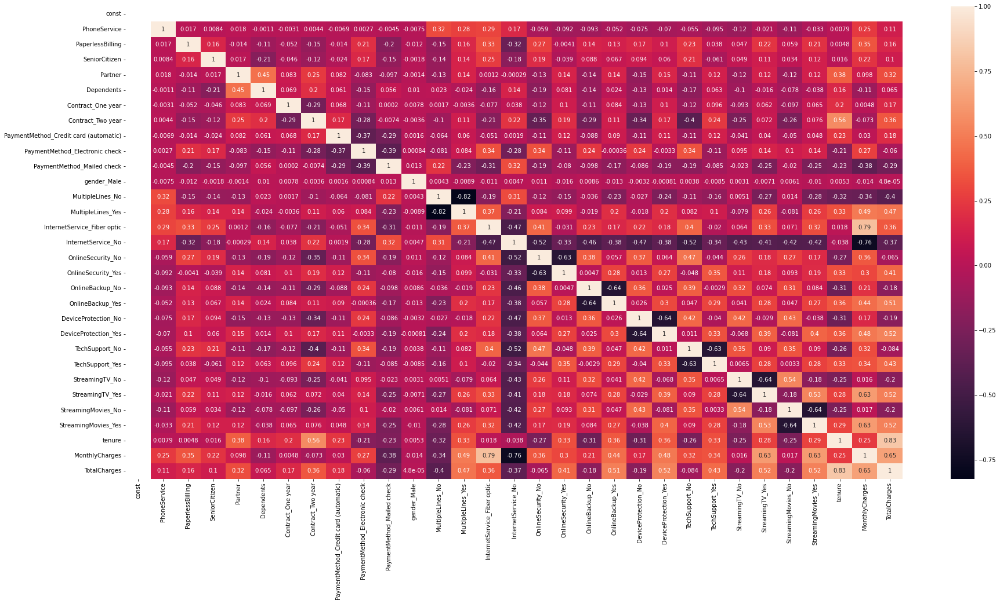

In [33]:
plt.figure(figsize=(30,15))
sns.heatmap(X.corr(), annot=True)

In [34]:
# Dropping highly Correlated values
# writing a correlation function to remove highly correlated variables (>70% threshold)

def correlation(dataset, threshold=0.70):
    col_corr = set() # Set of all names of correlated values
    corr_matrix = dataset.corr()
    
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i,j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
    
    return col_corr 

In [35]:
corr_features = correlation(X)
len(set(corr_features))

3

In [36]:
corr_features

{'MonthlyCharges', 'MultipleLines_Yes', 'TotalCharges'}

In [37]:
X.drop(['MonthlyCharges', 'MultipleLines_Yes', 'TotalCharges'], axis=1, inplace=True)

In [38]:
# Checking for Multicolinearity

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()

vif['variables'] = X.columns

vif['VIF SCORE'] = [round(variance_inflation_factor(X.values, i),2) for i in range(X.shape[1])]

c:\users\gitanshu\appdata\local\programs\python\python39\lib\site-packages\statsmodels\regression\linear_model.py:1782: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
c:\users\gitanshu\appdata\local\programs\python\python39\lib\site-packages\statsmodels\stats\outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


In [39]:
vif.sort_values(by = 'VIF SCORE')

,variables,VIF SCORE
0,const,0.00
11,gender_Male,1.00
3,SeniorCitizen,1.15
2,PaperlessBilling,1.21
5,Dependents,1.38
1,PhoneService,1.45
4,Partner,1.46
12,MultipleLines_No,1.46
8,PaymentMethod_Credit card (automatic),1.56
6,Contract_One year,1.63


In [40]:
X.drop(['OnlineSecurity_No', 'OnlineBackup_Yes', 'OnlineBackup_No', 'OnlineBackup_Yes',
       'TechSupport_No', 'TechSupport_Yes', 'StreamingTV_No', 'StreamingTV_Yes', 
        'StreamingMovies_No', 'StreamingMovies_Yes', 'Partner', 'Dependents', 'PaymentMethod_Electronic check', 
        'gender_Male', 'InternetService_No', 'OnlineSecurity_Yes', 
        'DeviceProtection_No', 'DeviceProtection_Yes'], axis=1, inplace=True)

<Axes: >

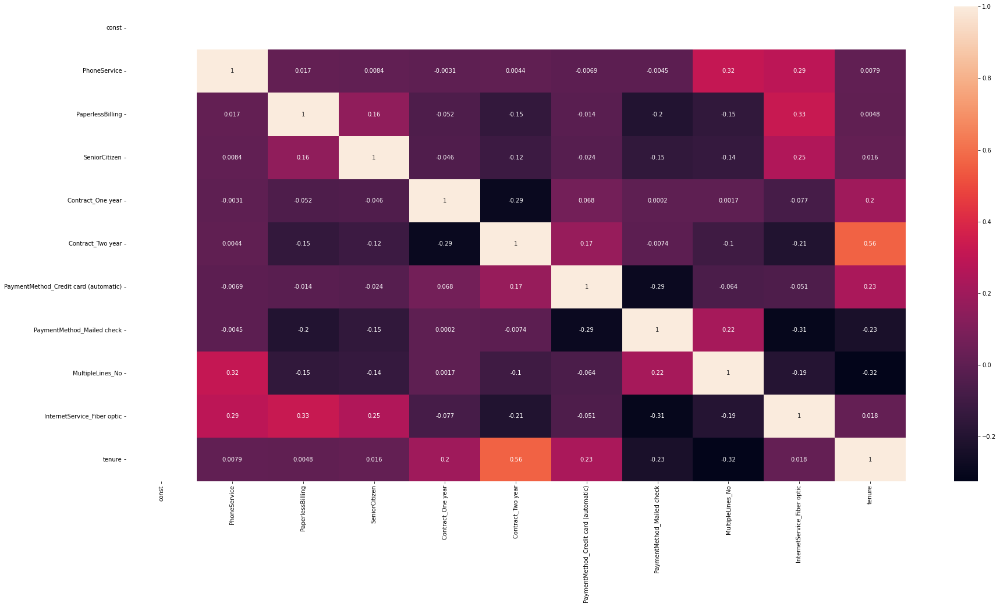

In [41]:
plt.figure(figsize=(30,15))
sns.heatmap(X.corr(), annot=True)

In [42]:
# Rerunning out Model

# Splitting of data set 

X_train,X_test, y_train,y_test = train_test_split(X,y, test_size=0.2, random_state=51)

In [43]:
logm1 = sm.Logit(y_train, X_train)
logm1.fit().summary()

Optimization terminated successfully.
         Current function value: 0.427124
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  Churn   No. Observations:                 5625
Model:                          Logit   Df Residuals:                     5614
Method:                           MLE   Df Model:                           10
Date:                Tue, 16 Apr 2024   Pseudo R-squ.:                  0.2632
Time:                        11:48:13   Log-Likelihood:                -2402.6
converged:                       True   LL-Null:                       -3261.0
Covariance Type:            nonrobust   LLR p-value:                     0.000
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                    -1.2051      0.139     -8.695      0.000      -1.477      -0.933
PhoneService                             -0.4903      0.144     -3.398      0.001      -0.773      -0.207
PaperlessBilling                          0.4552      0.081      5.617      0.000       0.296       0.614
SeniorCitizen                             0.2631      0.092      2.870      0.004       0.083       0.443
Contract_One year                        -0.7133      0.113     -6.294      0.000      -0.935      -0.491
Contract_Two year                        -1.5177      0.184     -8.235      0.000      -1.879      -1.157
PaymentMethod_Credit card (automatic)    -0.3843      0.103     -3.717      0.000      -0.587      -0.182
PaymentMethod_Mailed check               -0.4011      0.099     -4.054      0.000      -0.595      -0.207
MultipleLines_No                         -0.3335      0.086     -3.866      0.000      -0.503      -0.164
InternetService_Fiber optic               1.3500      0.092     14.680      0.000       1.170       1.530
tenure                                   -0.8632      0.057    -15.067      0.000      -0.975      -0.751
=========================================================================================================
"""

Now you see after removing all multicolinear features we got all P values to zero, so now we can say that all features are statistically significant

In [44]:
# Feature selection by RFE
# import RFE and logistic Regression

from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

In [45]:
logreg = LogisticRegression()

rfe = RFE(logreg)

rfe = rfe.fit(X,y)

print(rfe.support_)
print(rfe.ranking_)

[False  True False False  True  True False False False  True  True]
[2 1 3 7 1 1 6 5 4 1 1]


In [46]:
# Printing column names that are supported by RFE
X.columns[(rfe.support_)]

Index(['PhoneService', 'Contract_One year', 'Contract_Two year',
       'InternetService_Fiber optic', 'tenure'],
      dtype='object')

In [47]:
# Variables slected by RFE

col = ['PhoneService', 'Contract_One year', 'Contract_Two year',
       'InternetService_Fiber optic', 'tenure']

In [48]:
# Let's run the model using the selected variables but this time we will use Logistic Regression

logsk = LogisticRegression()
logsk.fit(X_train[col], y_train)

LogisticRegression()

In [49]:
# Recreate the model using stats model with RFE selected column

logm3 = sm.Logit(y_train, X_train[col])
logm3.fit().summary()

Optimization terminated successfully.
         Current function value: 0.441732
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  Churn   No. Observations:                 5625
Model:                          Logit   Df Residuals:                     5620
Method:                           MLE   Df Model:                            4
Date:                Tue, 16 Apr 2024   Pseudo R-squ.:                  0.2380
Time:                        12:27:02   Log-Likelihood:                -2484.7
converged:                       True   LL-Null:                       -3261.0
Covariance Type:            nonrobust   LLR p-value:                     0.000
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
PhoneService                   -1.6531      0.079    -20.960      0.000      -1.808      -1.498
Contract_One year              -1.1262      0.106    -10.644      0.000      -1.334      -0.919
Contract_Two year              -2.0953      0.176    -11.925      0.000      -2.440      -1.751
InternetService_Fiber optic     1.6476      0.082     20.028      0.000       1.486       1.809
tenure                         -0.5982      0.048    -12.355      0.000      -0.693      -0.503
===============================================================================================
"""

In [50]:
y_pred = logsk.predict_proba(X_test[col])

In [51]:
y_pred_df = pd.DataFrame(y_pred)

In [53]:
y_pred_1 = y_pred_df.iloc[:, [1]]
y_pred_1.head()

,1
0,0.693873
1,0.177488
2,0.296429
3,0.009142
4,0.078373


In [54]:
y_test_df = pd.DataFrame(y_test)

In [55]:
y_test_df['CustID'] = y_test_df.index

In [56]:
y_test_df

,Churn,CustID
5136,0,5136
1442,0,1442
6761,0,6761
856,0,856
1254,0,1254
4320,0,4320
463,1,463
712,0,712
6791,1,6791
1784,1,1784


In [57]:
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [60]:
y_pred_final = pd.concat([y_pred_1,y_test_df], axis=1)


In [61]:
y_pred_final = y_pred_final.rename(columns={1: 'Churn_prob'})
y_pred_final

,Churn_prob,Churn,CustID
0,0.693873,0,5136
1,0.177488,0,1442
2,0.296429,0,6761
3,0.009142,0,856
4,0.078373,0,1254
5,0.021577,0,4320
6,0.661220,1,463
7,0.013830,0,712
8,0.359553,1,6791
9,0.278063,1,1784


In [62]:
y_pred_final = y_pred_final.reindex(columns=['CustID', 'Churn', 'Churn_prob'])
y_pred_final.head()

,CustID,Churn,Churn_prob
0,5136,0,0.693873
1,1442,0,0.177488
2,6761,0,0.296429
3,856,0,0.009142
4,1254,0,0.078373


In [65]:
y_pred_final['Predicted'] = y_pred_final.Churn_prob.map(lambda x: 1 if x>0.5 else 0)
y_pred_final.head(10)

,CustID,Churn,Churn_prob,Predicted
0,5136,0,0.693873,1
1,1442,0,0.177488,0
2,6761,0,0.296429,0
3,856,0,0.009142,0
4,1254,0,0.078373,0
5,4320,0,0.021577,0
6,463,1,0.661220,1
7,712,0,0.013830,0
8,6791,1,0.359553,0
9,1784,1,0.278063,0


In [66]:
# Model Evaluation

help(confusion_matrix)

Help on function confusion_matrix in module sklearn.metrics._classification:

confusion_matrix(y_true, y_pred, *, labels=None, sample_weight=None, normalize=None)
    Compute confusion matrix to evaluate the accuracy of a classification.
    
    By definition a confusion matrix :math:`C` is such that :math:`C_{i, j}`
    is equal to the number of observations known to be in group :math:`i` and
    predicted to be in group :math:`j`.
    
    Thus in binary classification, the count of true negatives is
    :math:`C_{0,0}`, false negatives is :math:`C_{1,0}`, true positives is
    :math:`C_{1,1}` and false positives is :math:`C_{0,1}`.
    
    Read more in the :ref:`User Guide <confusion_matrix>`.
    
    Parameters
    ----------
    y_true : array-like of shape (n_samples,)
        Ground truth (correct) target values.
    
    y_pred : array-like of shape (n_samples,)
        Estimated targets as returned by a classifier.
    
    labels : array-like of shape (n_classes), default=

In [67]:
cm = confusion_matrix(y_pred_final.Churn, y_pred_final.Predicted)
cm

array([[917, 120],
       [182, 188]], dtype=int64)

In [68]:
accuracy_score(y_pred_final.Churn, y_pred_final.Predicted)

0.7853589196872779

In [71]:
TN = cm[0,0]
TP = cm[1,1]
FP = cm[0,1]
FN = cm[1,0]

In [72]:
# Sensitivity of our Logistic Regression Model

TP/float(TP+FN)

0.5081081081081081

In [73]:
# Specificity

TN/float(TN+FP)

0.8842815814850531

In [74]:
# Calculate false positve rate, predicting churn when customer does not have changed

print(FP/float(TN+FP))

0.11571841851494696


In [76]:
# Positive values predicted

print(TP/float(TP+FP))

0.6103896103896104


In [77]:
# Negative predicted value

print(TN / float(TN+FN))

0.8343949044585988


In [78]:
from sklearn.metrics import classification_report
print(classification_report(y_pred_final.Churn, y_pred_final.Predicted))

              precision    recall  f1-score   support

           0       0.83      0.88      0.86      1037
           1       0.61      0.51      0.55       370

    accuracy                           0.79      1407
   macro avg       0.72      0.70      0.71      1407
weighted avg       0.78      0.79      0.78      1407

